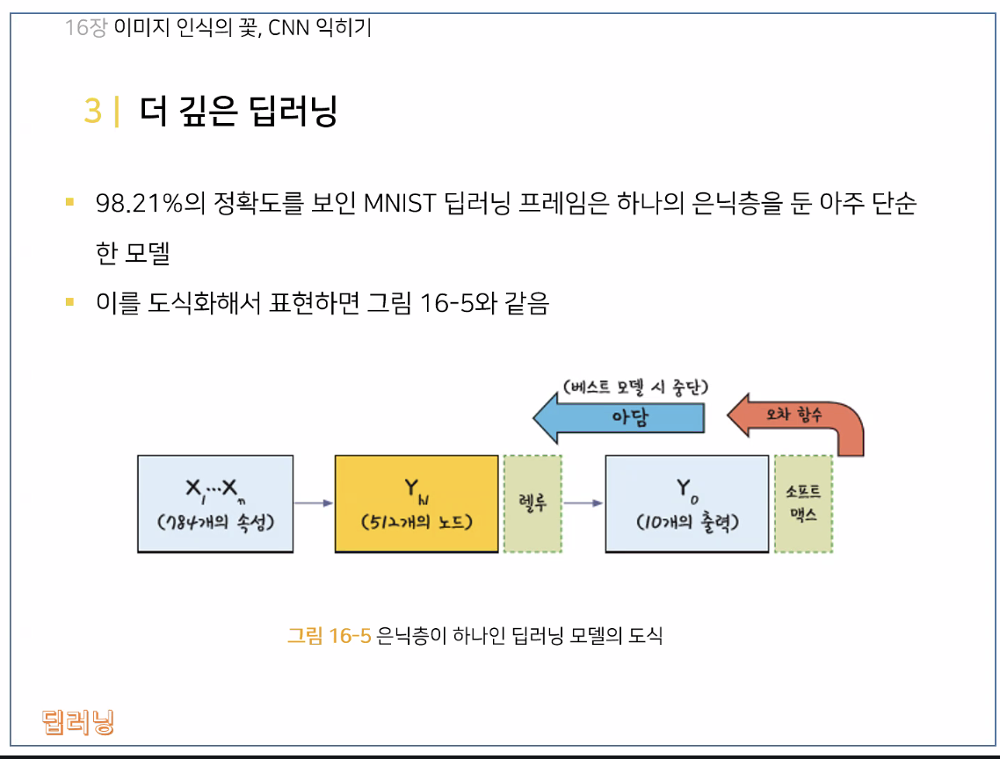

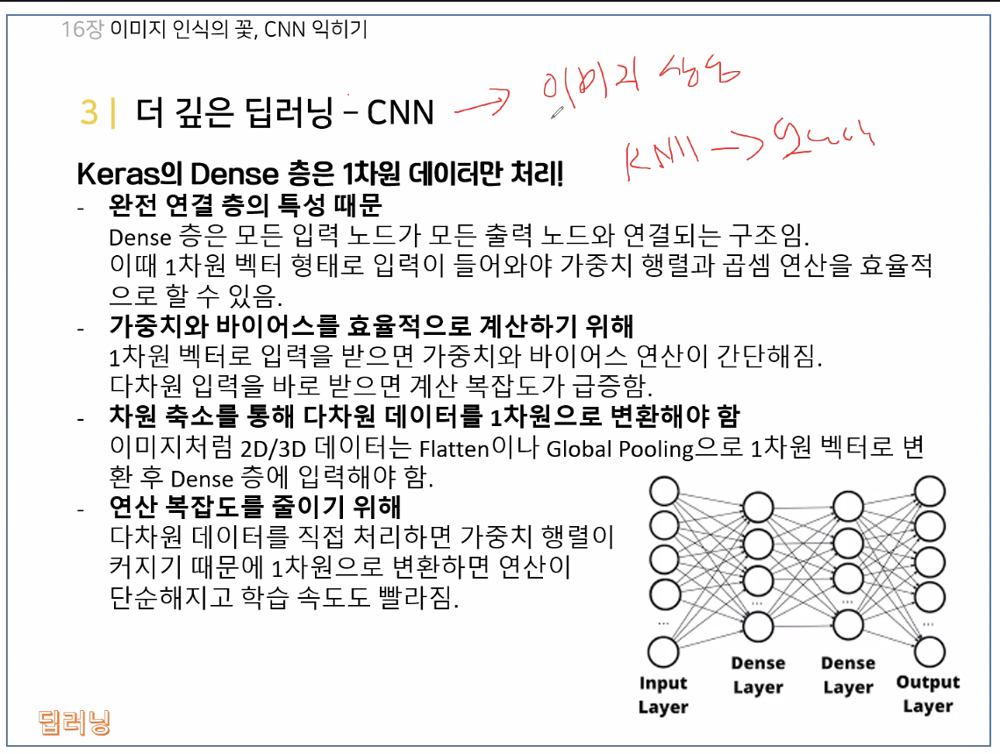

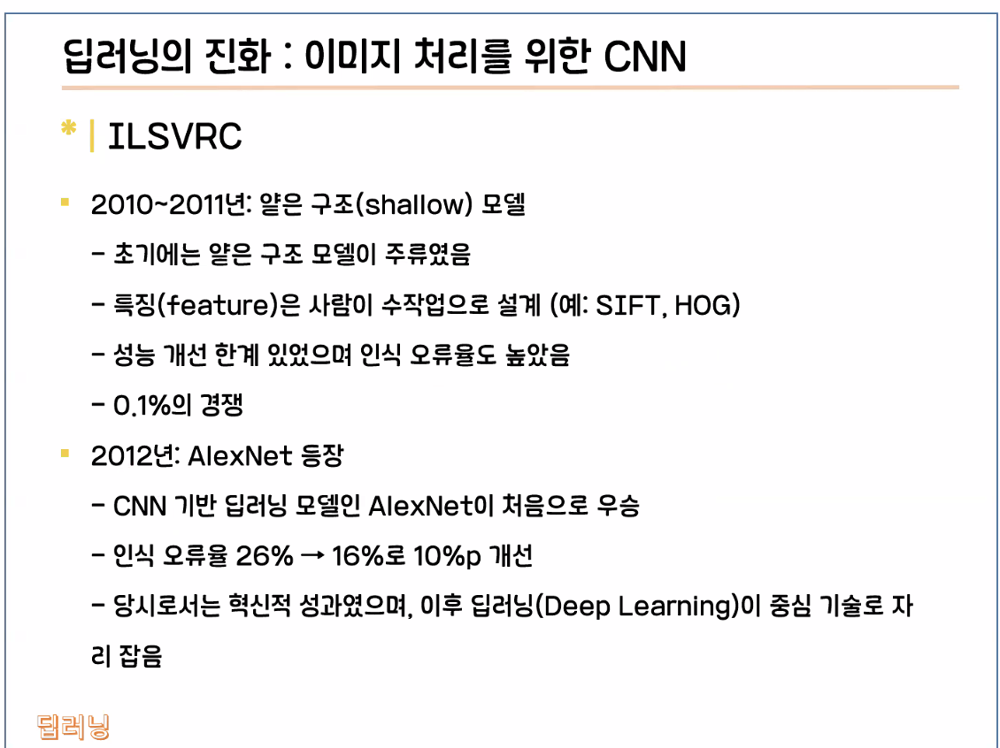

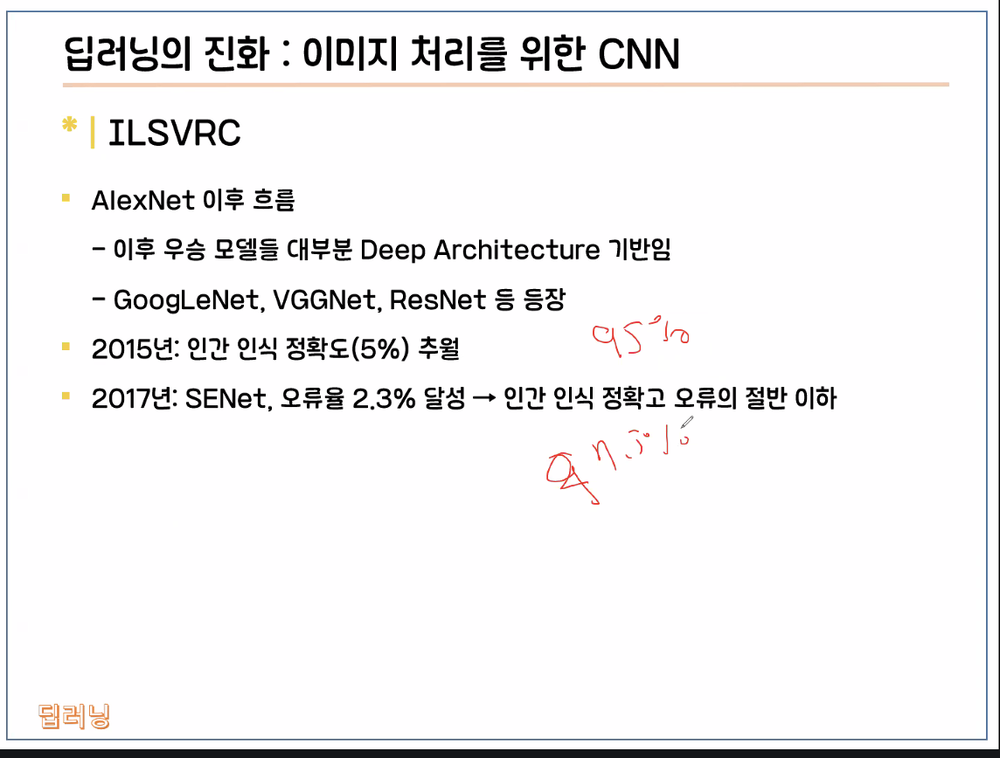

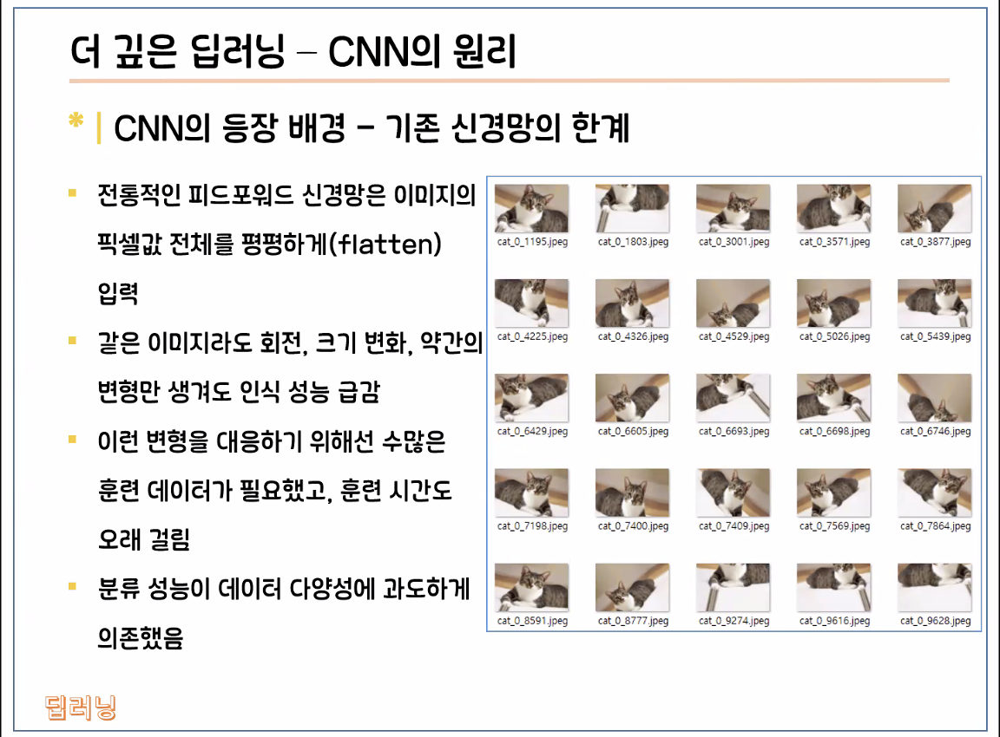

...

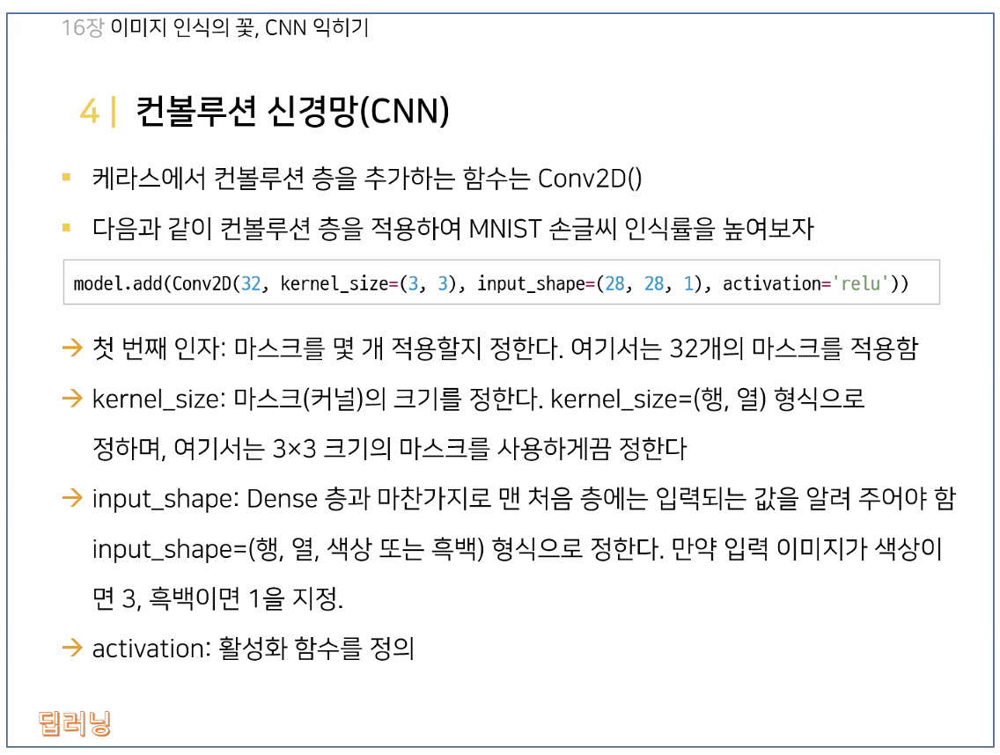

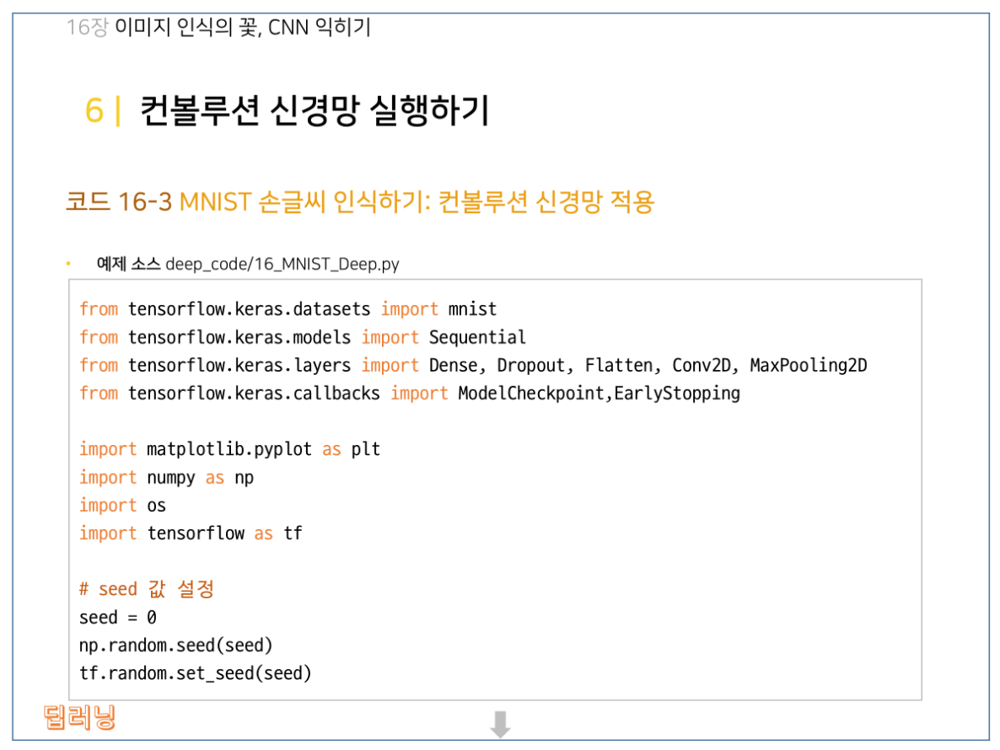

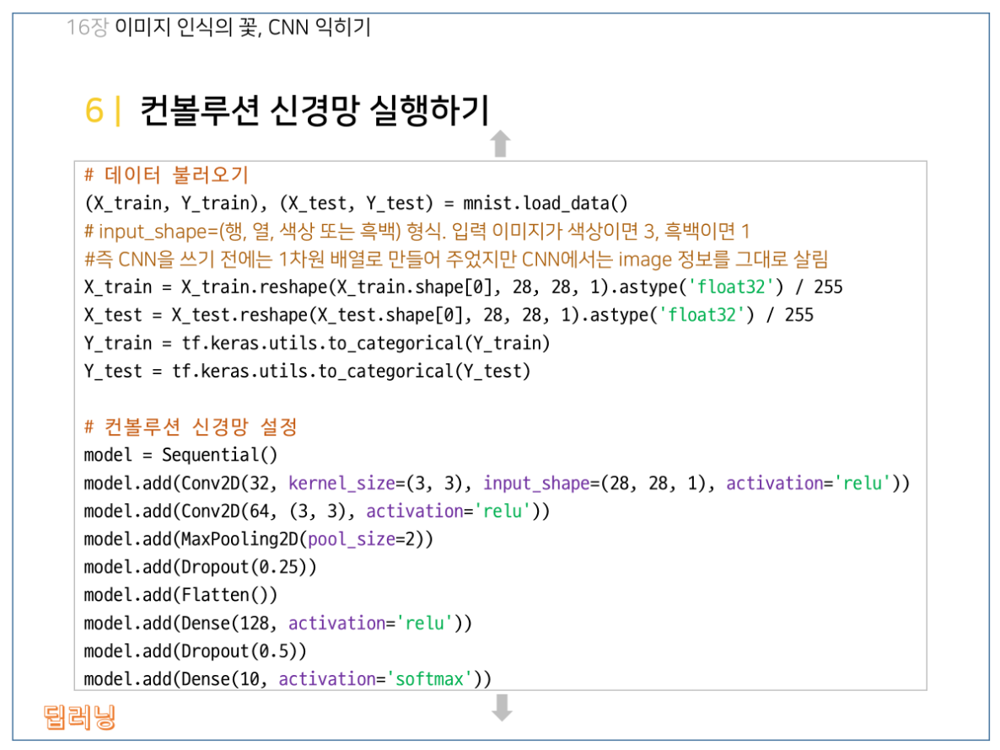

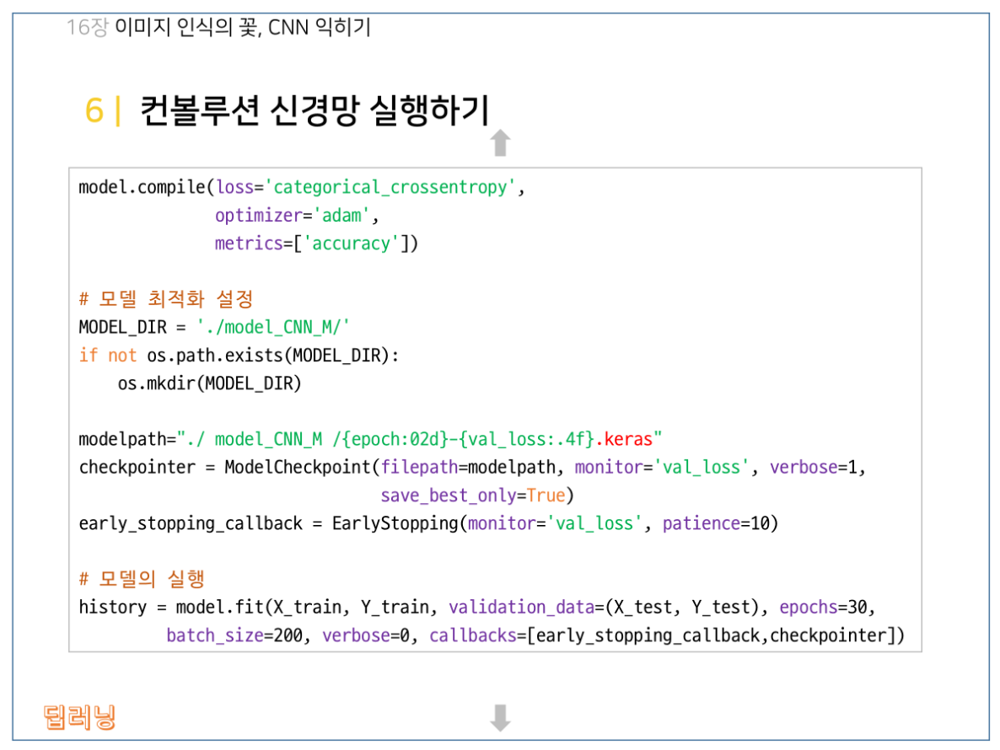

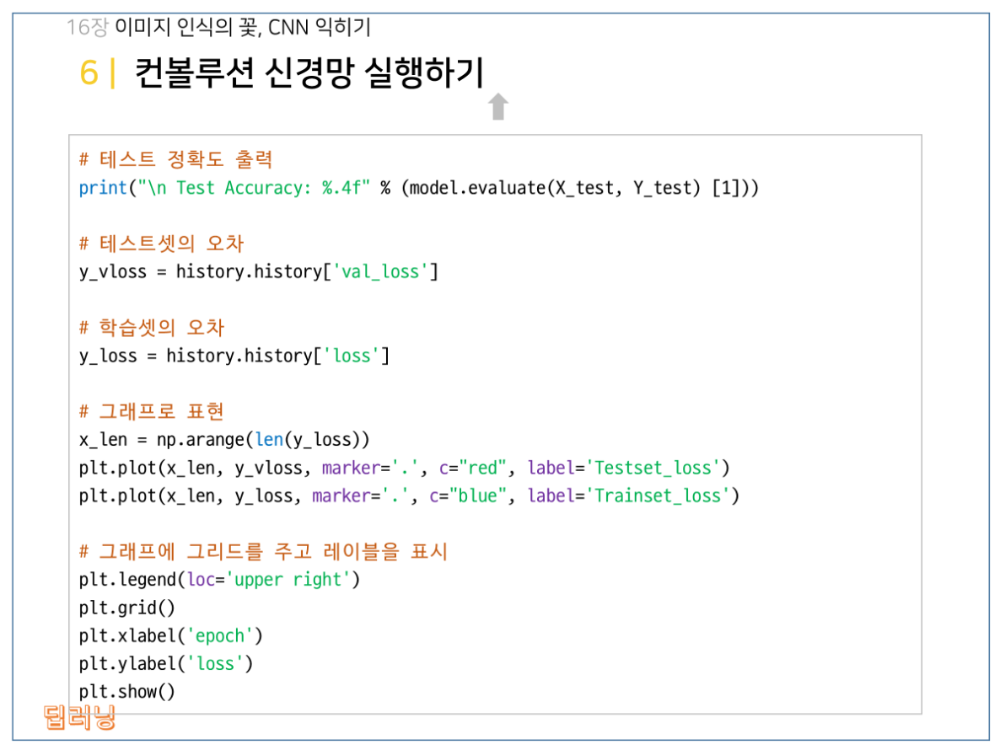

/opt/anaconda3/envs/tf/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_loss improved from None to 0.05740, saving model to ./model_CNN_M/01-0.0574.keras

Epoch 1: finished saving model to ./model_CNN_M/01-0.0574.keras

Epoch 2: val_loss improved from 0.05740 to 0.03851, saving model to ./model_CNN_M/02-0.0385.keras

Epoch 2: finished saving model to ./model_CNN_M/02-0.0385.keras

Epoch 3: val_loss improved from 0.03851 to 0.03344, saving model to ./model_CNN_M/03-0.0334.keras

Epoch 3: finished saving model to ./model_CNN_M/03-0.0334.keras

Epoch 4: val_loss improved from 0.03344 to 0.03095, saving model to ./model_CNN_M/04-0.0310.keras

Epoch 4: finished saving model to ./model_CNN_M/04-0.0310.keras

Epoch 5: val_loss improved from 0.03095 to 0.03036, saving model to ./model_CNN_M/05-0.0304.keras

Epoch 5: finished saving model to ./model_CNN_M/05-0.0304.keras

Epoch 6: val_loss improved from 0.03036 to 0.02995, saving model to ./model_CNN_M/06-0.0300.keras

Epoch 6: finished saving model to ./model_CNN_M/06-0.0300.keras

Epoch 7: val_loss 

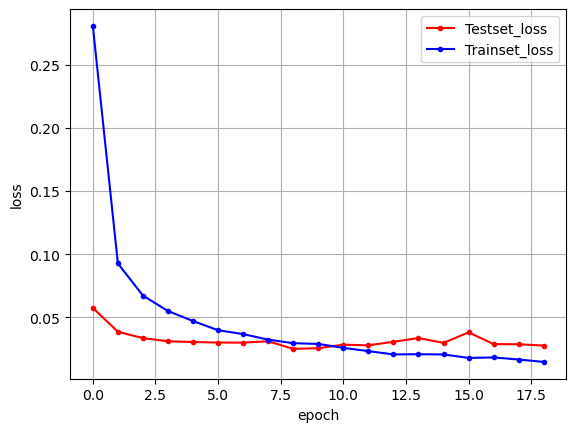

In [1]:
from tensorflow.keras.datasets import mnist
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping

import matplotlib.pyplot as plt
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import tensorflow as tf

# seed 값 설정
seed = 0
np.random.seed(seed)
tf.random.set_seed(seed)

# 데이터 불러오기
(X_train, Y_train), (X_test, Y_test) = mnist.load_data()
#input_shape=(행,열,색상 또는 흑백) 형식. 입력 이미지가 색상이면 3, 흑백이면 1
#즉 CNN을 쓰기 전에는 1차원 배열로 만들어 주었지만 CNN에서는 image 정보를 그대로 살림
X_train = X_train.reshape(X_train.shape[0], 28, 28, 1).astype('float32') / 255
X_test = X_test.reshape(X_test.shape[0], 28, 28, 1).astype('float32') / 255
Y_train = tf.keras.utils.to_categorical(Y_train)
Y_test = tf.keras.utils.to_categorical(Y_test)

# 컨볼루션 신경망 설정
model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3), input_shape=(28, 28, 1), activation='relu'))
model.add(Conv2D(64, (3, 3), activation='relu'))
# 이미지 사이즈를 줄여서 주요 feature만 뽑아내기
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(10, activation='softmax'))

model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

# 모델 최적화 설정
MODEL_DIR = './model_CNN_M/'
if not os.path.exists(MODEL_DIR):
    os.mkdir(MODEL_DIR)

modelpath='./model_CNN_M/{epoch:02d}-{val_loss:.4f}.keras'
checkpointer = ModelCheckpoint(filepath=modelpath, monitor='val_loss', verbose=1,
                               save_best_only=True)
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=10)

# 모델의 실행
history = model.fit(X_train, Y_train, validation_data=(X_test, Y_test), epochs=30,
                    batch_size=200, verbose=0, callbacks=[early_stopping_callback,checkpointer])

# 테스트 정확도 출력
print("\n Test Accuracy: %.4f" % (model.evaluate(X_test, Y_test) [1]))

# 테스트셋의 오차
y_vloss = history.history['val_loss']

# 학습셋의 오차
y_loss = history.history['loss']

# 그래프로 표현
x_len = np.arange(len(y_loss))
plt.plot(x_len, y_vloss, marker='.', c="red", label='Testset_loss')
plt.plot(x_len, y_loss, marker='.', c="blue", label='Trainset_loss')

# 그래프에 그리드를 주고 레이블을 표시
plt.legend(loc='upper right')
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()


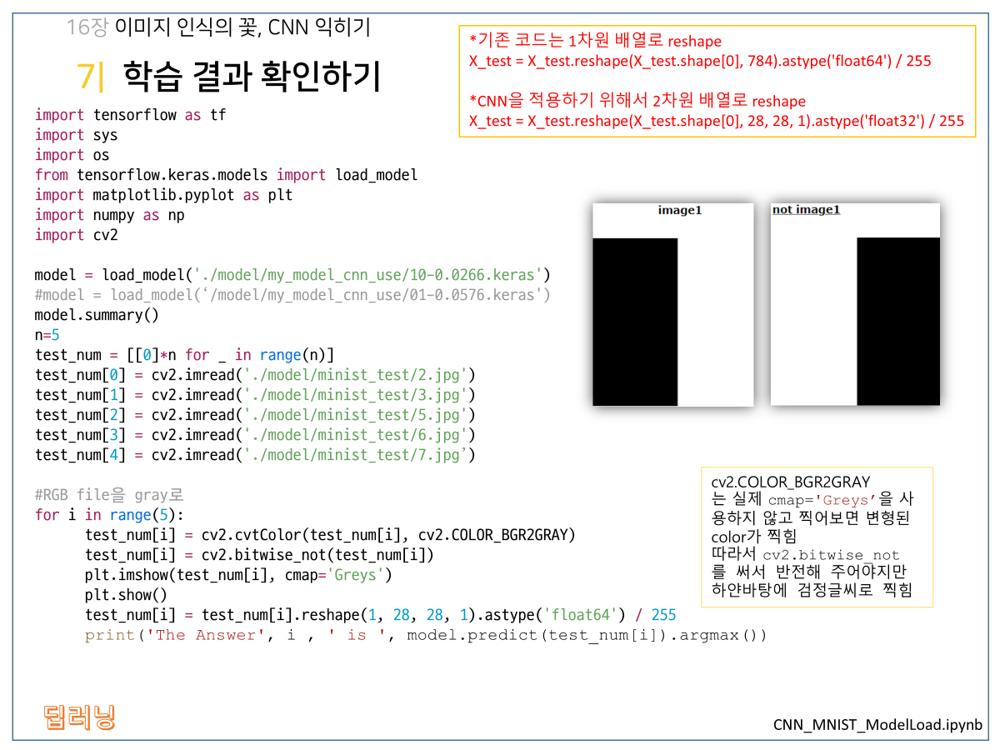

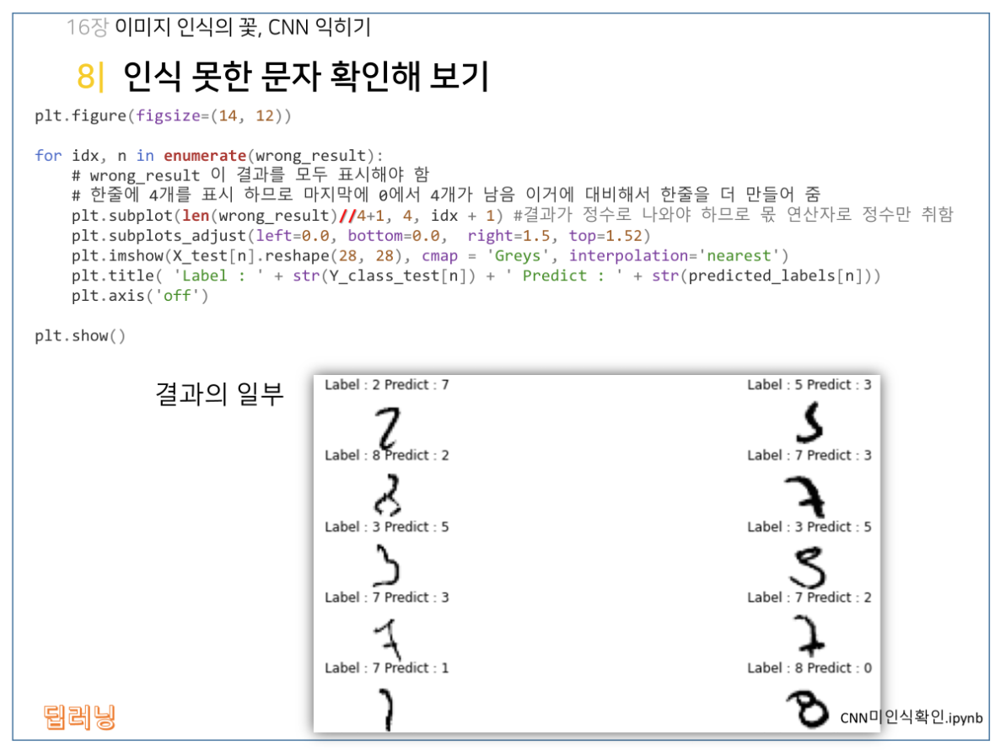

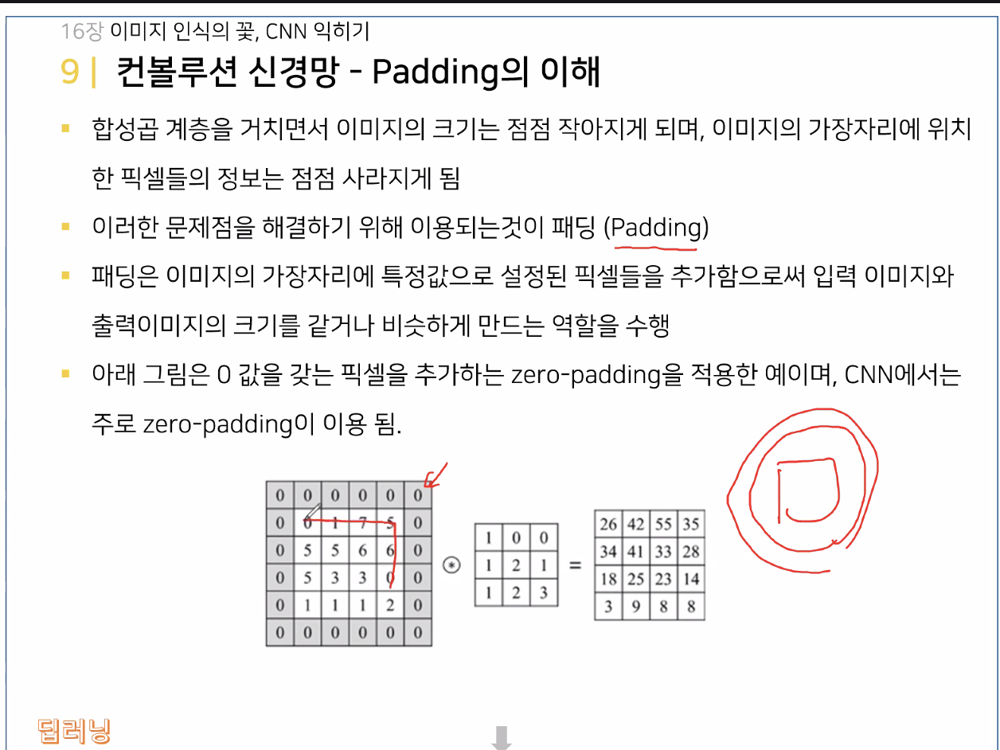

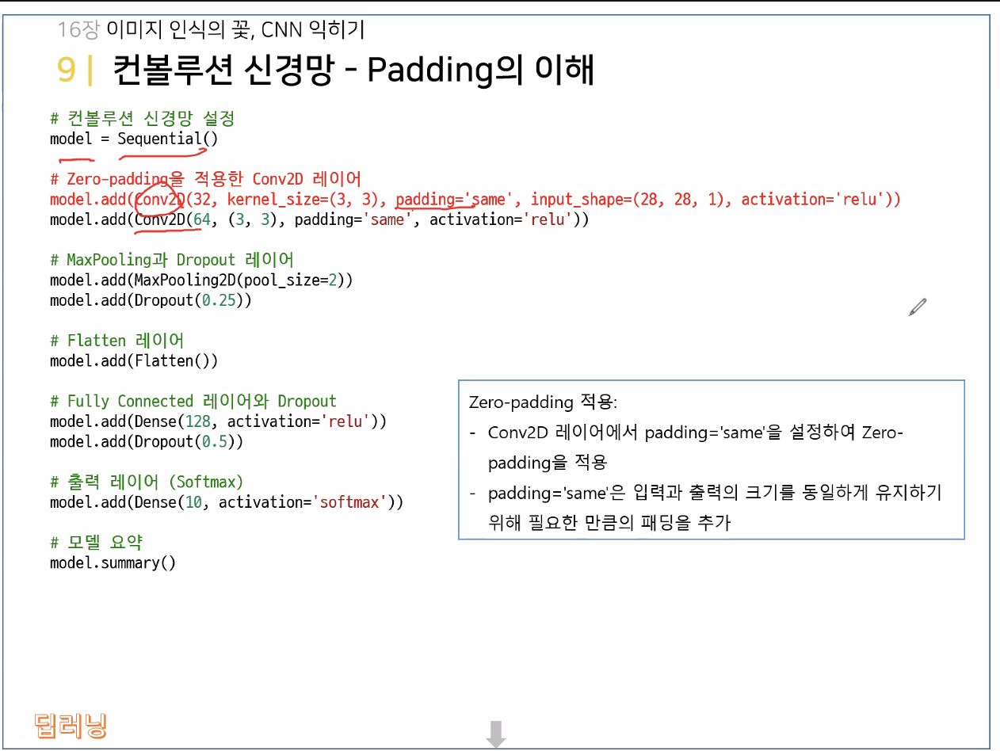

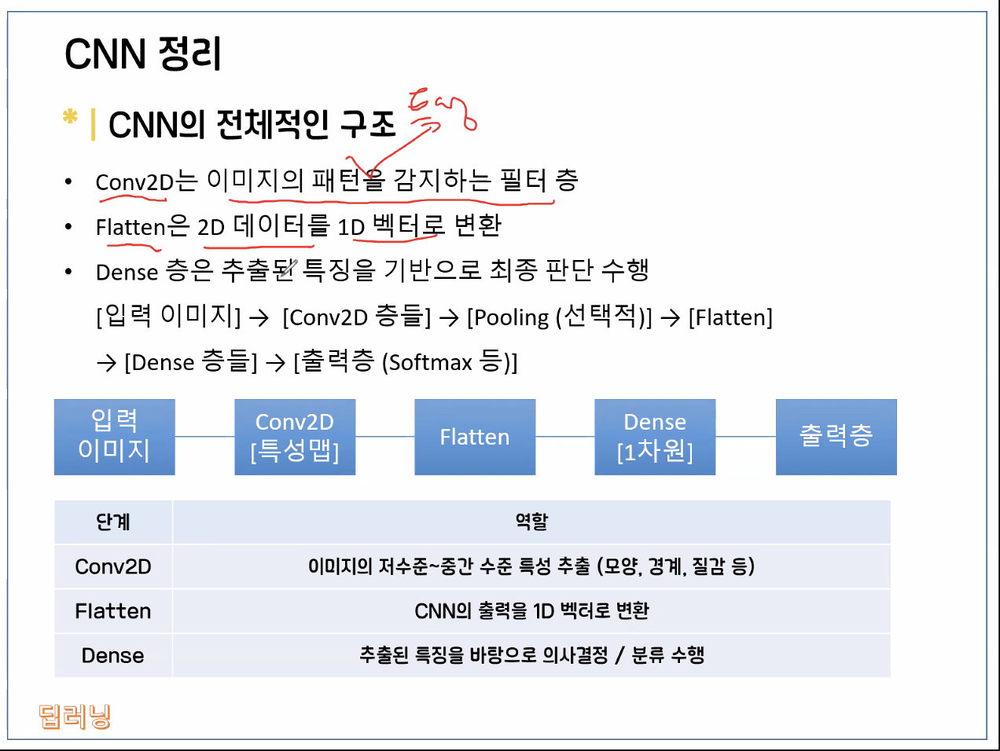

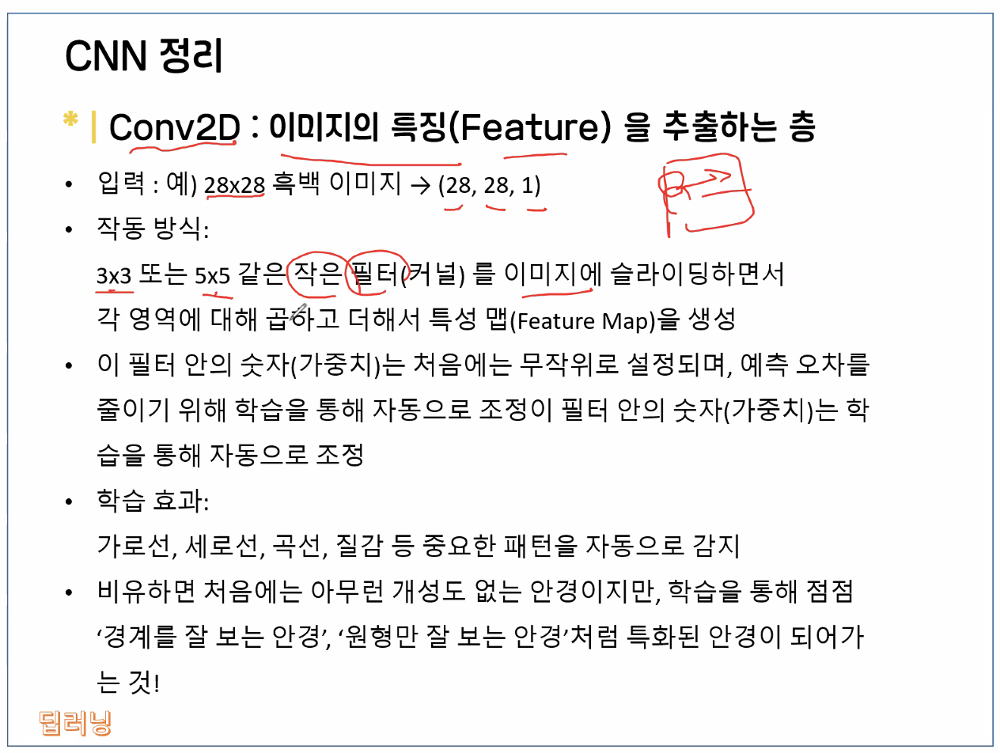

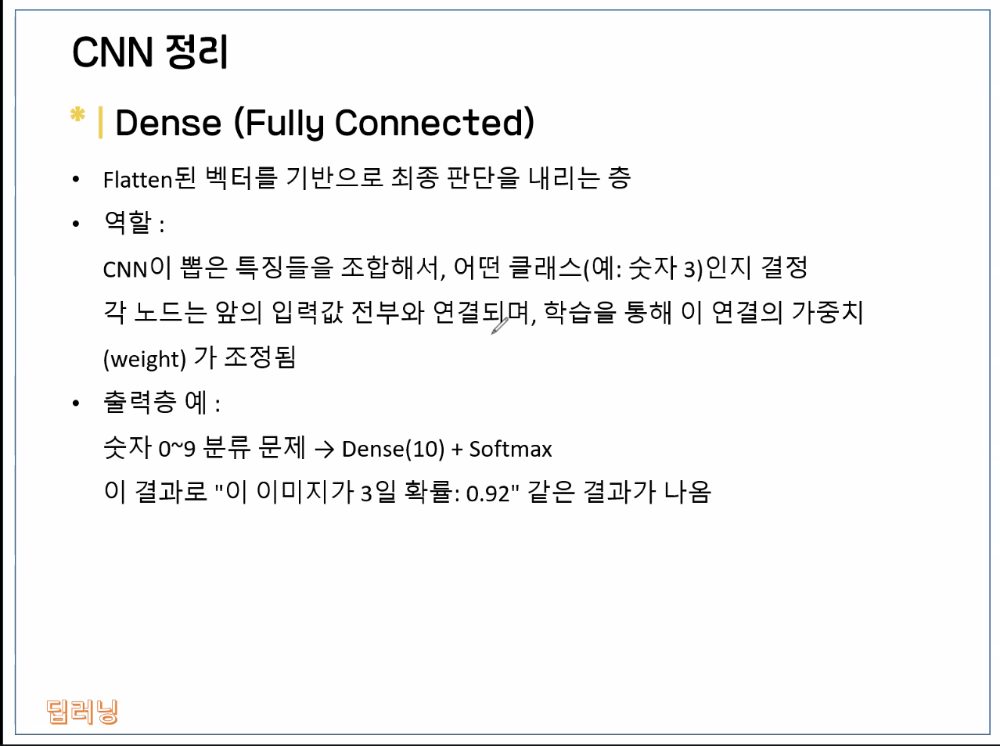

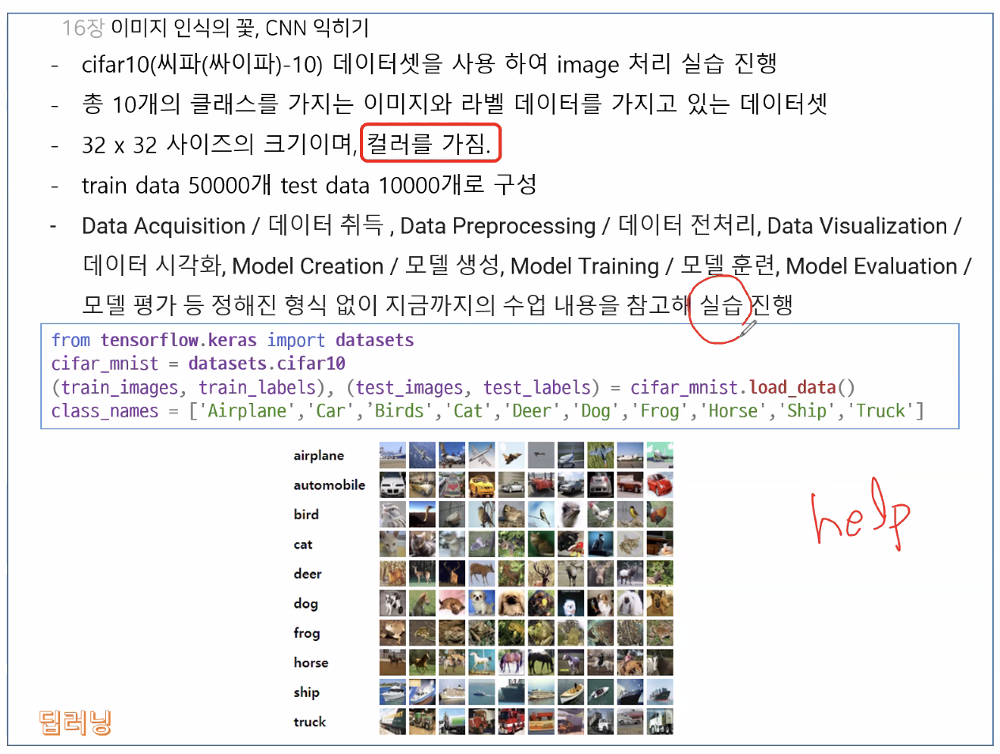

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 15s 0us/step


/opt/anaconda3/envs/tf/lib/python3.11/site-packages/keras/src/datasets/cifar.py:18: VisibleDeprecationWarning: dtype(): align should be passed as Python or NumPy boolean but got `align=0`. Did you mean to pass a tuple to create a subarray type? (Deprecated NumPy 2.4)
  d = cPickle.load(f, encoding="bytes")


train_images: (50000, 32, 32, 3)
train_labels: (50000, 1)
test_images: (10000, 32, 32, 3)
test_labels: (10000, 1)


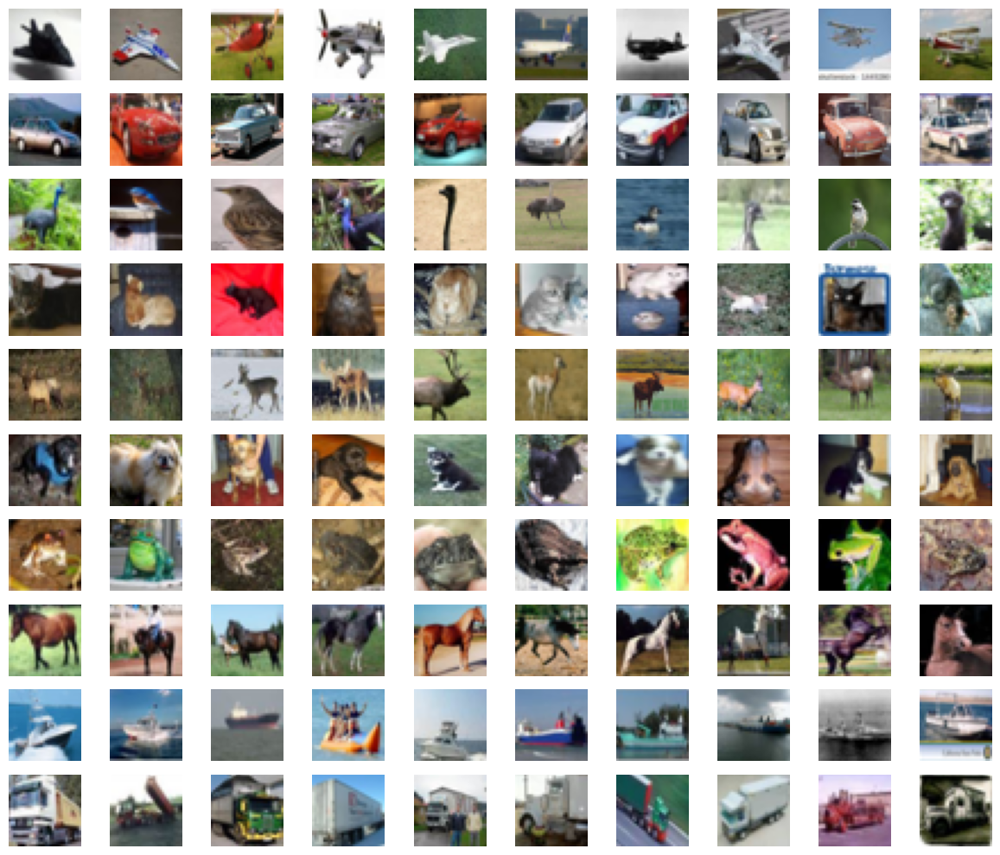

In [1]:
from tensorflow.keras import datasets
import matplotlib.pyplot as plt
import numpy as np

# CIFAR-10 데이터셋 불러오기
cifar_mnist = datasets.cifar10
(train_images, train_labels), (test_images, test_labels) = cifar_mnist.load_data()

# CIFAR-10 클래스 이름
class_names = ['Airplane', 'Car', 'Birds', 'Cat', 'Deer', 'Dog', 'Frog', 'Horse', 'Ship', 'Truck']

print('train_images:', train_images.shape)
print('train_labels:', train_labels.shape)
print('test_images:', test_images.shape)
print('test_labels:', test_labels.shape)

# 클래스별 이미지 확인
plt.figure(figsize=(12, 10))

for class_idx, class_name in enumerate(class_names):
    image_indices = np.where(train_labels.reshape(-1) == class_idx)[0][:10]

    for i, image_idx in enumerate(image_indices):
        plt.subplot(10, 10, class_idx * 10 + i + 1)
        plt.imshow(train_images[image_idx])
        plt.axis('off')

        if i == 0:
            plt.ylabel(class_name, rotation=0, labelpad=35, fontsize=9, va='center')

plt.tight_layout()
plt.show()


In [ ]:
import os
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# 데이터 전처리
# CIFAR-10 이미지는 0~255 사이의 픽셀값을 가지므로 255로 나누어 0~1 범위로 정규화한다.
X_train = train_images.astype('float32') / 255.0
X_test = test_images.astype('float32') / 255.0
# 라벨은 (50000, 1) 형태이므로 모델 학습에 쓰기 편하게 1차원으로 바꾼다.
y_train = train_labels.reshape(-1)
y_test = test_labels.reshape(-1)

# CIFAR-10 CNN 모델 생성
# Sequential은 층을 위에서 아래 순서대로 차곡차곡 쌓는 방식이다.
model = Sequential()
# Conv2D: 이미지에서 선, 모서리, 색상 패턴 같은 특징을 찾는다.
# input_shape=(32, 32, 3)은 32x32 크기의 컬러 이미지라는 뜻이다.
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)))
# MaxPooling2D: 중요한 특징만 남기고 이미지 크기를 줄여 계산량을 낮춘다.
model.add(MaxPooling2D((2, 2)))
# 필터 수를 늘려 더 복잡한 특징을 학습한다.
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
# Flatten: 2차원 특징 맵을 Dense 층에 넣을 수 있도록 1차원 벡터로 펼친다.
model.add(Flatten())
# Dense: 앞에서 찾은 특징들을 조합해서 최종 분류 판단을 한다.
model.add(Dense(64, activation='relu'))
# Dropout: 일부 뉴런을 잠시 꺼서 과적합을 줄인다.
model.add(Dropout(0.5))
# CIFAR-10은 10개 클래스를 분류하므로 출력 노드는 10개, 활성화 함수는 softmax를 사용한다.
model.add(Dense(10, activation='softmax'))

# sparse_categorical_crossentropy는 정답 라벨이 0~9 정수일 때 사용하는 다중 분류 손실 함수이다.
model.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

model.summary()

# 모델 최적화 설정
# 학습 중 검증 오차(val_loss)가 가장 낮은 모델만 파일로 저장한다.
MODEL_DIR = './model_CIFAR10_CNN/'
if not os.path.exists(MODEL_DIR):
    os.mkdir(MODEL_DIR)

modelpath = './model_CIFAR10_CNN/{epoch:02d}-{val_loss:.4f}.keras'
checkpointer = ModelCheckpoint(filepath=modelpath, monitor='val_loss', verbose=1,
                               save_best_only=True)
# EarlyStopping: 검증 오차가 5번 연속 좋아지지 않으면 학습을 일찍 멈춘다.
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=5,
                                        restore_best_weights=True)

# 모델 학습
# validation_data로 테스트셋을 넣어 학습 중에도 성능 변화를 확인한다.
history = model.fit(X_train, y_train,
                    validation_data=(X_test, y_test),
                    epochs=10,
                    batch_size=64,
                    callbacks=[early_stopping_callback, checkpointer])

# 테스트 정확도 출력
# 학습이 끝난 모델을 test 데이터로 평가하여 최종 정확도를 확인한다.
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print()
print('Test Accuracy: %.4f' % test_accuracy)

# 학습 결과 그래프
# 왼쪽은 손실(loss), 오른쪽은 정확도(accuracy)를 epoch별로 비교한다.
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], marker='.', c='blue', label='Trainset_loss')
plt.plot(history.history['val_loss'], marker='.', c='red', label='Testset_loss')
plt.legend(loc='upper right')
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], marker='.', c='blue', label='Trainset_accuracy')
plt.plot(history.history['val_accuracy'], marker='.', c='red', label='Testset_accuracy')
plt.legend(loc='lower right')
plt.grid()
plt.xlabel('epoch')
plt.ylabel('accuracy')

plt.tight_layout()
plt.show()


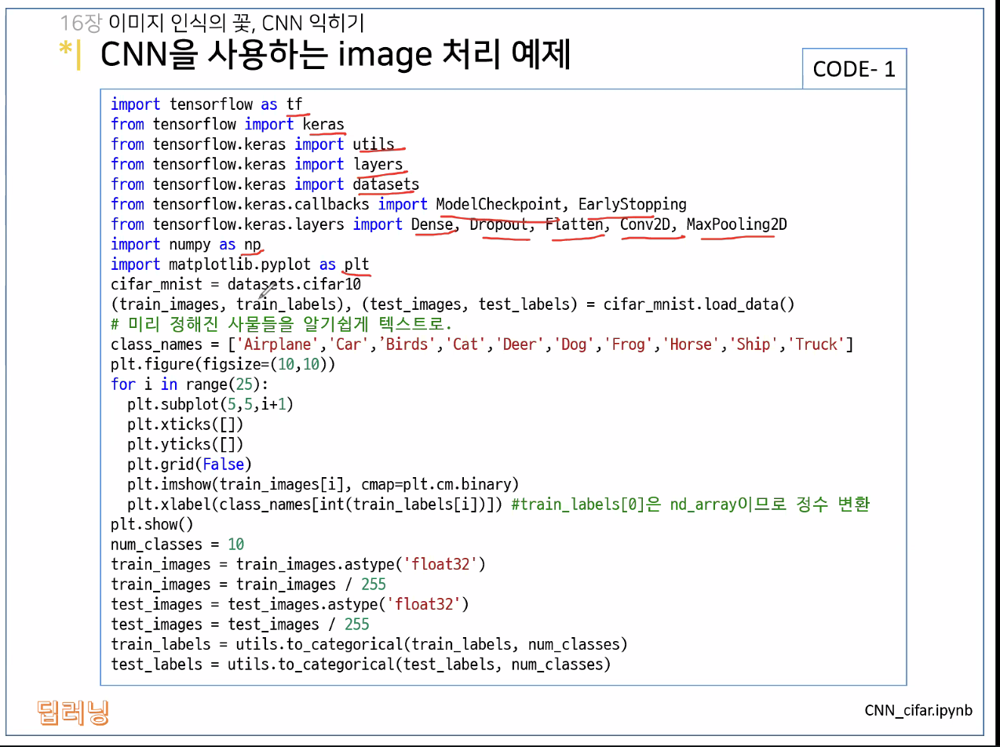

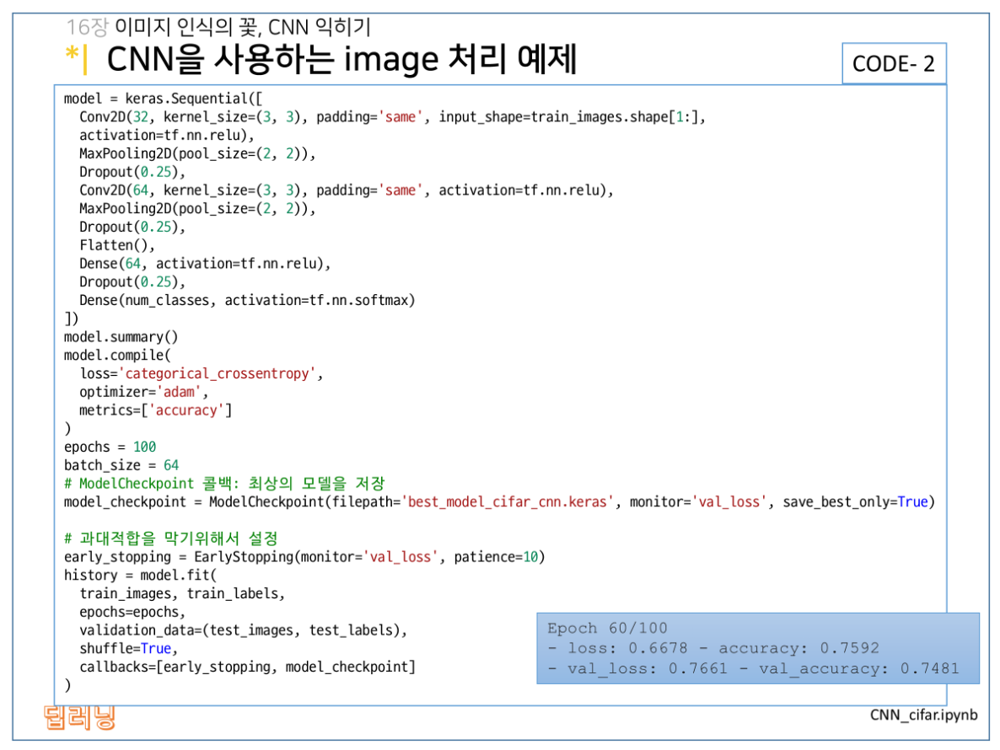

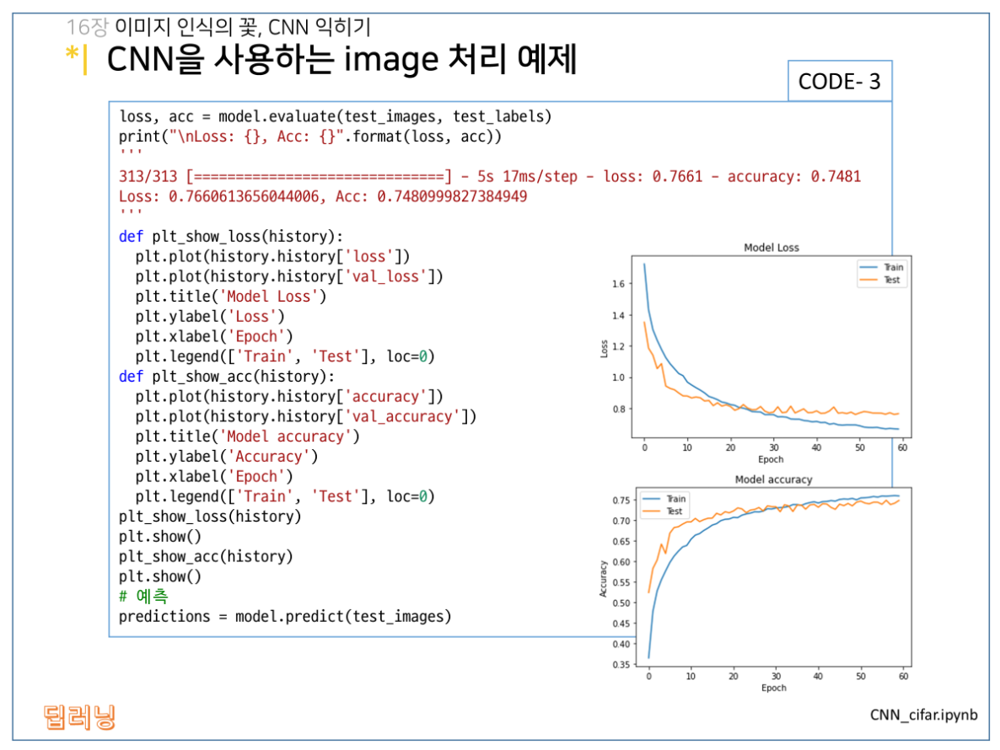

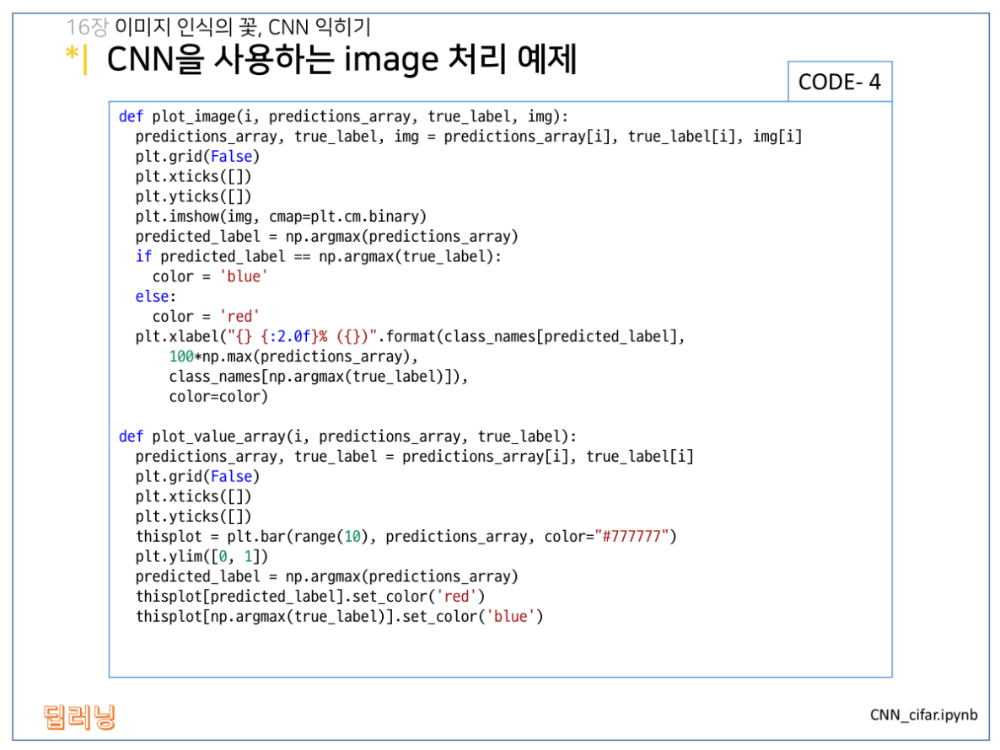

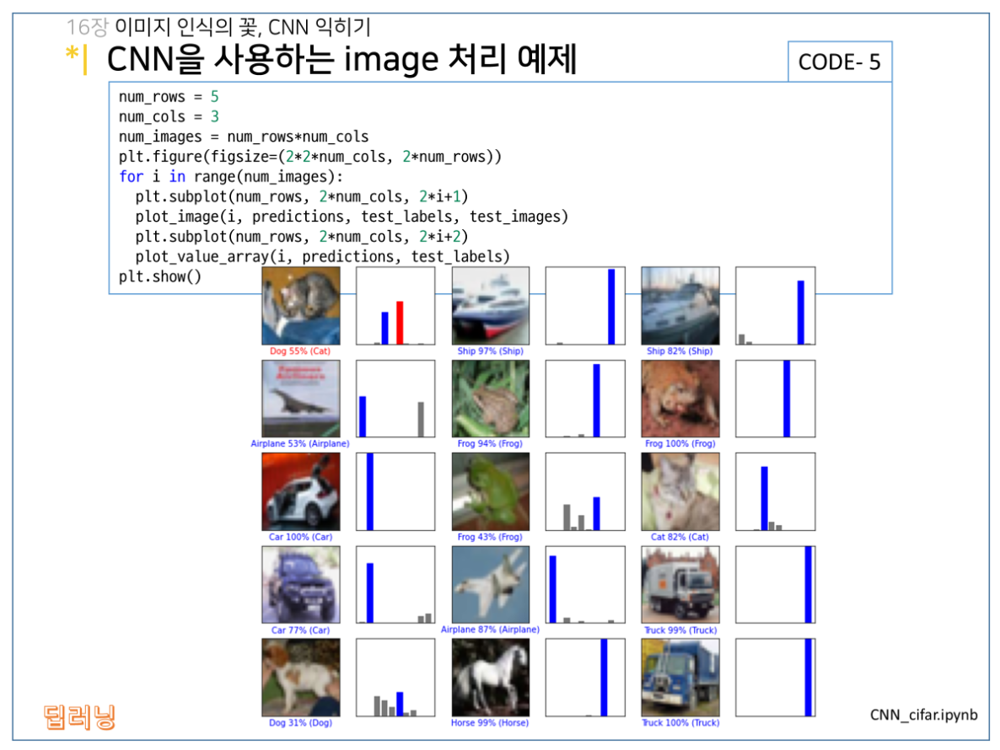

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import datasets, utils
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import numpy as np
import matplotlib.pyplot as plt

# 1. CIFAR-10 데이터셋 불러오기
# CIFAR-10은 32x32 크기의 컬러 이미지 10개 클래스로 구성된 데이터셋이다.
# train: 50,000장, test: 10,000장
cifar_mnist = datasets.cifar10
(train_images, train_labels), (test_images, test_labels) = cifar_mnist.load_data()

# 사람이 알아보기 쉬운 클래스 이름을 지정한다.
# 라벨 번호 0~9가 아래 class_names의 순서와 대응된다.
class_names = ['Airplane', 'Car', 'Birds', 'Cat', 'Deer', 'Dog', 'Frog', 'Horse', 'Ship', 'Truck']

# 2. 학습 이미지 일부 확인
# 모델을 만들기 전에 데이터가 어떻게 생겼는지 먼저 눈으로 확인한다.
plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i + 1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_images[i])
    plt.xlabel(class_names[int(train_labels[i][0])])
plt.show()

# 3. 데이터 전처리
num_classes = 10

# 이미지 픽셀값은 0~255 범위이므로 255로 나누어 0~1 범위로 정규화한다.
# 정규화를 하면 모델이 더 안정적으로 학습된다.
train_images = train_images.astype('float32') / 255
test_images = test_images.astype('float32') / 255

# 라벨을 원-핫 인코딩으로 변환한다.
# 예: 3 -> [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]
train_labels = utils.to_categorical(train_labels, num_classes)
test_labels = utils.to_categorical(test_labels, num_classes)

# 4. CNN 모델 생성
# Conv2D는 이미지의 특징을 찾고, MaxPooling2D는 중요한 특징만 남기며 크기를 줄인다.
# Dropout은 과적합을 줄이기 위해 일부 뉴런을 학습 중 임시로 꺼준다.
model = keras.Sequential([
    Conv2D(32, kernel_size=(3, 3), padding='same', input_shape=train_images.shape[1:],
           activation=tf.nn.relu),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.25),

    Conv2D(64, kernel_size=(3, 3), padding='same', activation=tf.nn.relu),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.25),

    # Flatten은 2차원 특징 맵을 Dense 층에 넣기 위해 1차원으로 펼친다.
    Flatten(),
    Dense(64, activation=tf.nn.relu),
    Dropout(0.25),

    # 출력층은 10개 클래스 중 하나를 고르는 문제이므로 Dense(10) + softmax를 사용한다.
    Dense(num_classes, activation=tf.nn.softmax)
])

model.summary()

# 5. 모델 컴파일
# 원-핫 인코딩된 라벨을 사용하므로 categorical_crossentropy를 사용한다.
model.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# 6. 학습 옵션 설정
epochs = 100
batch_size = 64

# ModelCheckpoint: 검증 손실(val_loss)이 가장 낮은 최상의 모델을 저장한다.
model_checkpoint = ModelCheckpoint(
    filepath='best_model_cifar_cnn.keras',
    monitor='val_loss',
    save_best_only=True
)

# EarlyStopping: 검증 손실이 10번 연속 좋아지지 않으면 학습을 멈춰 과적합을 막는다.
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# 7. 모델 학습
# validation_data를 지정하면 매 epoch마다 테스트셋 기준 성능을 함께 확인할 수 있다.
history = model.fit(
    train_images,
    train_labels,
    epochs=epochs,
    batch_size=batch_size,
    validation_data=(test_images, test_labels),
    shuffle=True,
    callbacks=[early_stopping, model_checkpoint]
)

# 8. 테스트 데이터로 최종 평가
loss, acc = model.evaluate(test_images, test_labels)
print()
print('Loss: {}, Acc: {}'.format(loss, acc))

# 9. 학습 과정 그래프 함수
def plt_show_loss(history):
    # 학습 손실과 검증 손실을 비교한다.
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc=0)


def plt_show_acc(history):
    # 학습 정확도와 검증 정확도를 비교한다.
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc=0)


plt_show_loss(history)
plt.show()

plt_show_acc(history)
plt.show()

# 10. 테스트 이미지 예측
# predictions[i]에는 i번째 테스트 이미지가 각 클래스일 확률 10개가 들어 있다.
predictions = model.predict(test_images)

# 11. 예측 결과를 이미지로 보여주는 함수
def plot_image(i, predictions_array, true_label, img):
    predictions_array, true_label, img = predictions_array[i], true_label[i], img[i]
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(img)

    predicted_label = np.argmax(predictions_array)
    true_label_index = np.argmax(true_label)

    # 예측이 맞으면 파란색, 틀리면 빨간색으로 표시한다.
    if predicted_label == true_label_index:
        color = 'blue'
    else:
        color = 'red'

    plt.xlabel('{} {:2.0f}% ({})'.format(
        class_names[predicted_label],
        100 * np.max(predictions_array),
        class_names[true_label_index]),
        color=color
    )


def plot_value_array(i, predictions_array, true_label):
    predictions_array, true_label = predictions_array[i], true_label[i]
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])

    # 10개 클래스에 대한 예측 확률을 막대그래프로 보여준다.
    thisplot = plt.bar(range(10), predictions_array, color='#777777')
    plt.ylim([0, 1])

    predicted_label = np.argmax(predictions_array)
    true_label_index = np.argmax(true_label)

    # 예측 클래스는 빨간색, 실제 정답 클래스는 파란색으로 표시한다.
    thisplot[predicted_label].set_color('red')
    thisplot[true_label_index].set_color('blue')


# 12. 여러 테스트 이미지의 예측 결과 확인
num_rows = 5
num_cols = 3
num_images = num_rows * num_cols
plt.figure(figsize=(2 * 2 * num_cols, 2 * num_rows))

for i in range(num_images):
    plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
    plot_image(i, predictions, test_labels, test_images)

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
    plot_value_array(i, predictions, test_labels)

plt.tight_layout()
plt.show()


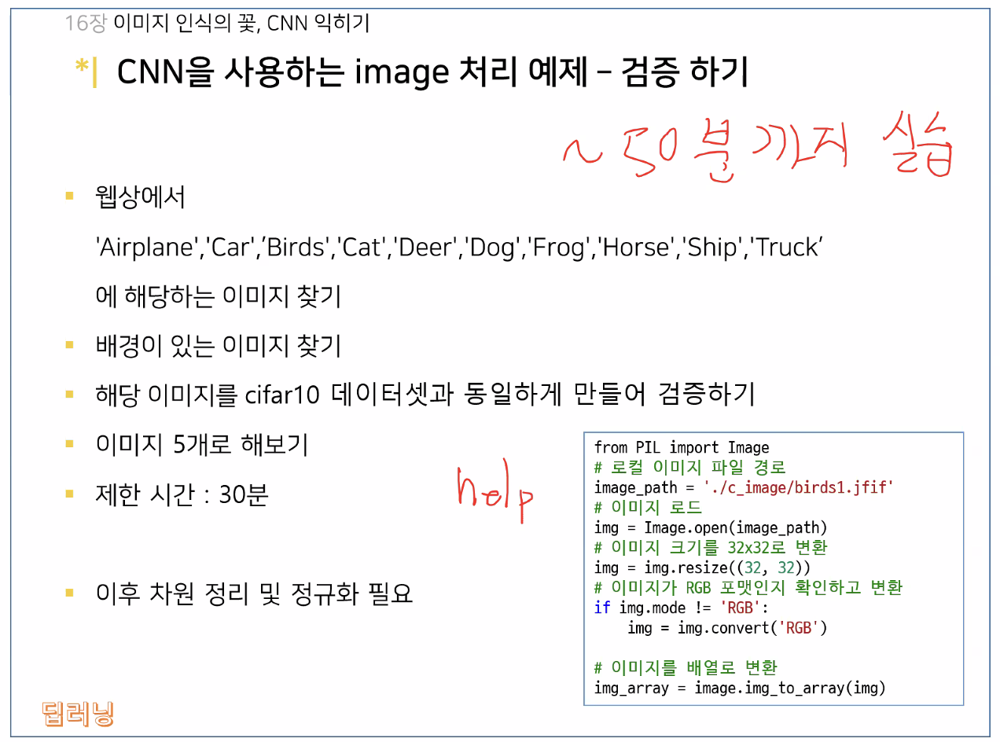

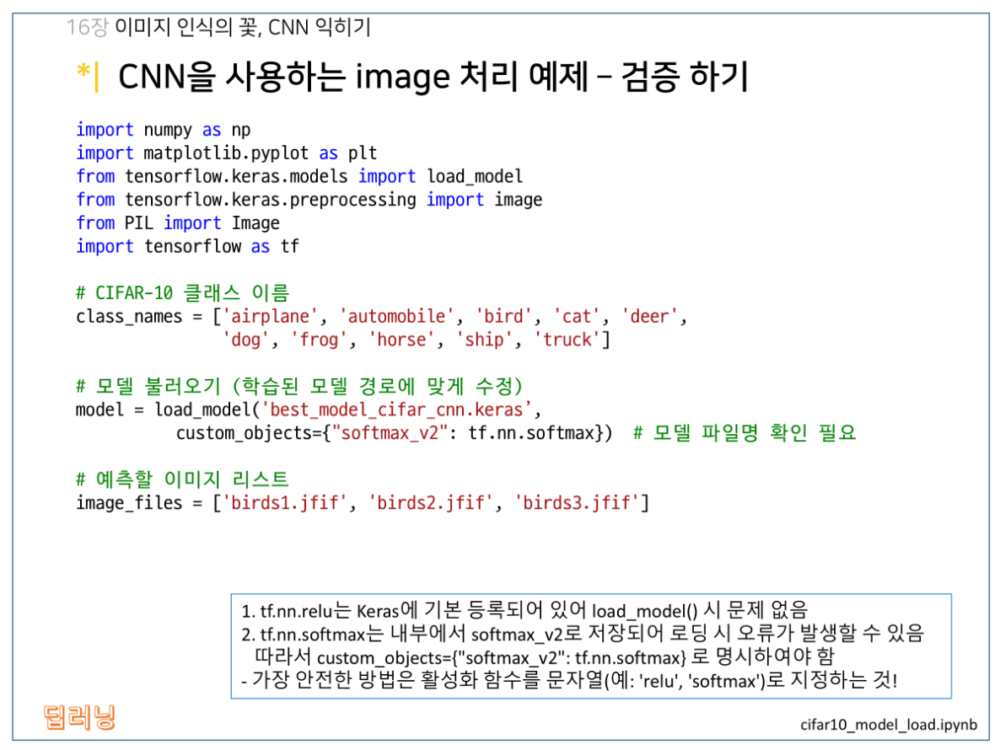

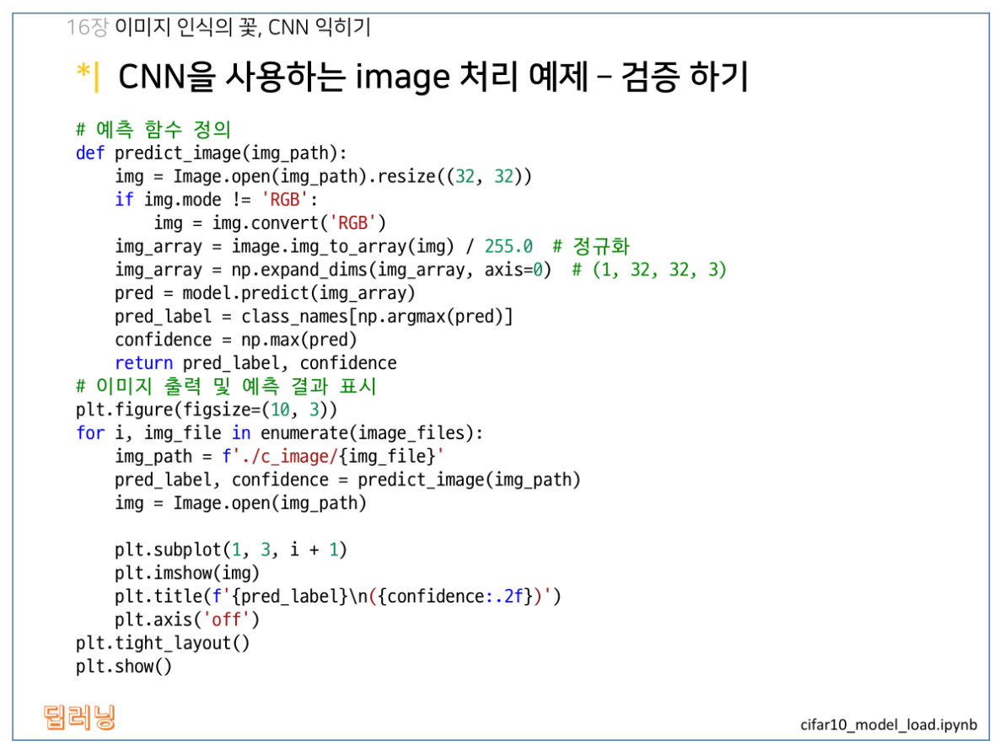

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from PIL import Image
import tensorflow as tf

# CIFAR-10 클래스 이름
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

# 모델 불러오기 (학습된 모델 경로에 맞게 수정)
model = load_model('best_model_cifar_cnn.keras',
                   custom_objects={"softmax_v2": tf.nn.softmax})  # 모델 파일명 확인 필요

# 예측할 이미지 리스트
image_files = ['birds1.jfif', 'birds2.jfif', 'birds3.jfif']

# 예측 함수 정의
def predict_image(img_path):
    img = Image.open(img_path).resize((32, 32))
    if img.mode != 'RGB':
        img = img.convert('RGB')
    img_array = image.img_to_array(img) / 255.0  # 정규화
    img_array = np.expand_dims(img_array, axis=0)  # (1, 32, 32, 3)
    pred = model.predict(img_array)
    pred_label = class_names[np.argmax(pred)]
    confidence = np.max(pred)
    return pred_label, confidence

# 이미지 출력 및 예측 결과 표시
plt.figure(figsize=(10, 3))
for i, img_file in enumerate(image_files):
    img_path = f'./c_image/{img_file}'
    pred_label, confidence = predict_image(img_path)
    img = Image.open(img_path)

    plt.subplot(1, 3, i + 1)
    plt.imshow(img)
    plt.title(f'{pred_label}\n({confidence:.2f})')
    plt.axis('off')

plt.tight_layout()
plt.show()


ValueError: File not found: filepath=best_model_cifar_cnn.keras. Please ensure the file is an accessible `.keras` zip file.